In [1]:
import networkx as nx

loaded_graph = nx.read_graphml("D:\MANU\GNN-for-asset-management\Graphs\pearson_correlation_graph.graphml")

print("Nodes:", loaded_graph.nodes(data=True))
print("Edges:", loaded_graph.edges(data=True))

Nodes: [('A', {'Name': 'Agilent Technologies', 'Sector': 'Health Care'}), ('AAL', {'Name': 'American Airlines Group', 'Sector': 'Industrials'}), ('AAP', {'Name': 'Advance Auto Parts', 'Sector': 'Consumer Discretionary'}), ('AAPL', {'Name': 'Apple', 'Sector': 'Information Technology'}), ('ABBV', {'Name': 'AbbVie', 'Sector': 'Health Care'}), ('ABC', {'Name': 'AmerisourceBergen', 'Sector': 'Health Care'}), ('ABT', {'Name': 'Abbott Laboratories', 'Sector': 'Health Care'}), ('ACN', {'Name': 'Accenture', 'Sector': 'Information Technology'}), ('ADBE', {'Name': 'Adobe', 'Sector': 'Information Technology'}), ('ADI', {'Name': 'Analog Devices', 'Sector': 'Information Technology'}), ('ADM', {'Name': 'ADM', 'Sector': 'Consumer Staples'}), ('ADP', {'Name': 'Automatic Data Processing', 'Sector': 'Information Technology'}), ('ADS', {}), ('ADSK', {'Name': 'Autodesk', 'Sector': 'Information Technology'}), ('AEE', {'Name': 'Ameren Corp', 'Sector': 'Utilities'}), ('AEP', {'Name': 'American Electric Power'

In [2]:
print(loaded_graph)

Graph with 505 nodes and 127260 edges


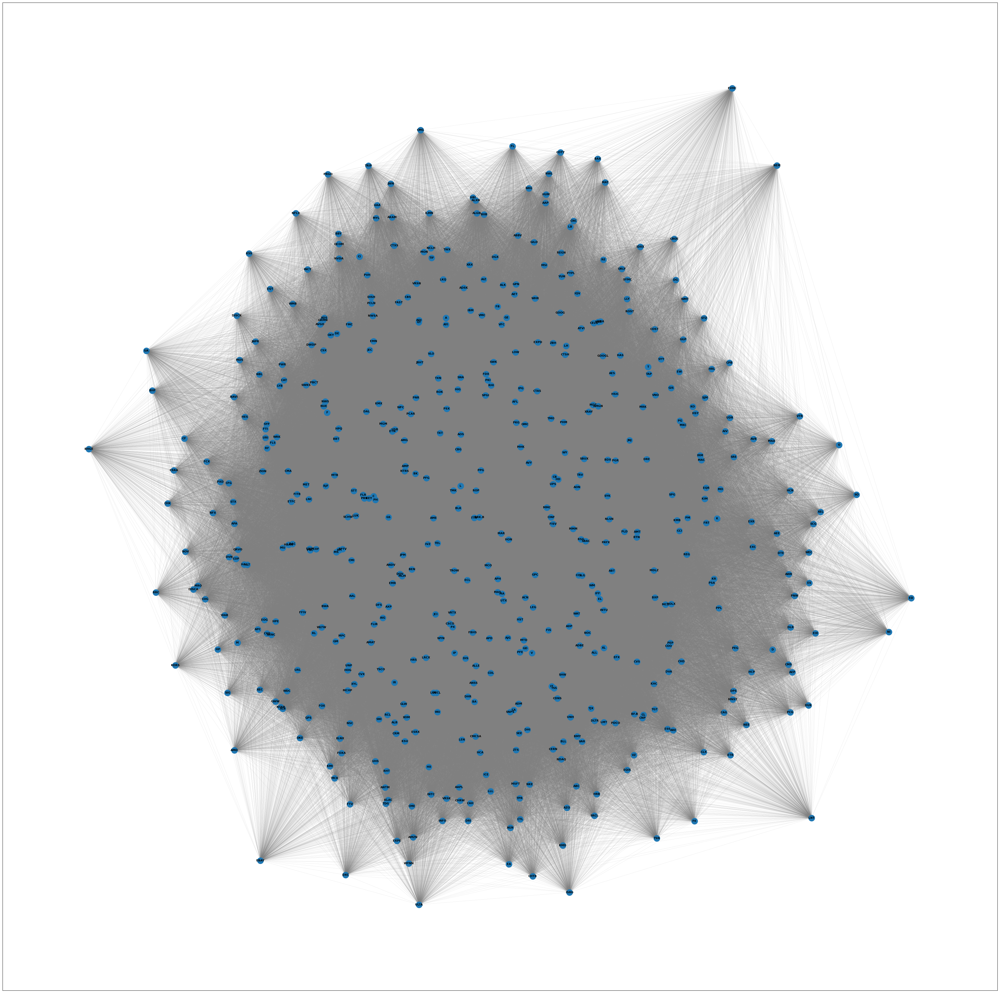

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(50, 50))

pos = nx.spring_layout(loaded_graph)
nx.draw_networkx(loaded_graph, pos, with_labels=True, font_size=8, font_color="black", font_weight="bold", edge_color="gray", width=0.1)

# Show the plot
plt.show()

In [4]:
mst = nx.minimum_spanning_tree(loaded_graph, weight='weight')

mst_graph = nx.Graph()
mst_graph.add_nodes_from(mst.nodes(data=True))
mst_graph.add_edges_from(mst.edges(data=True))


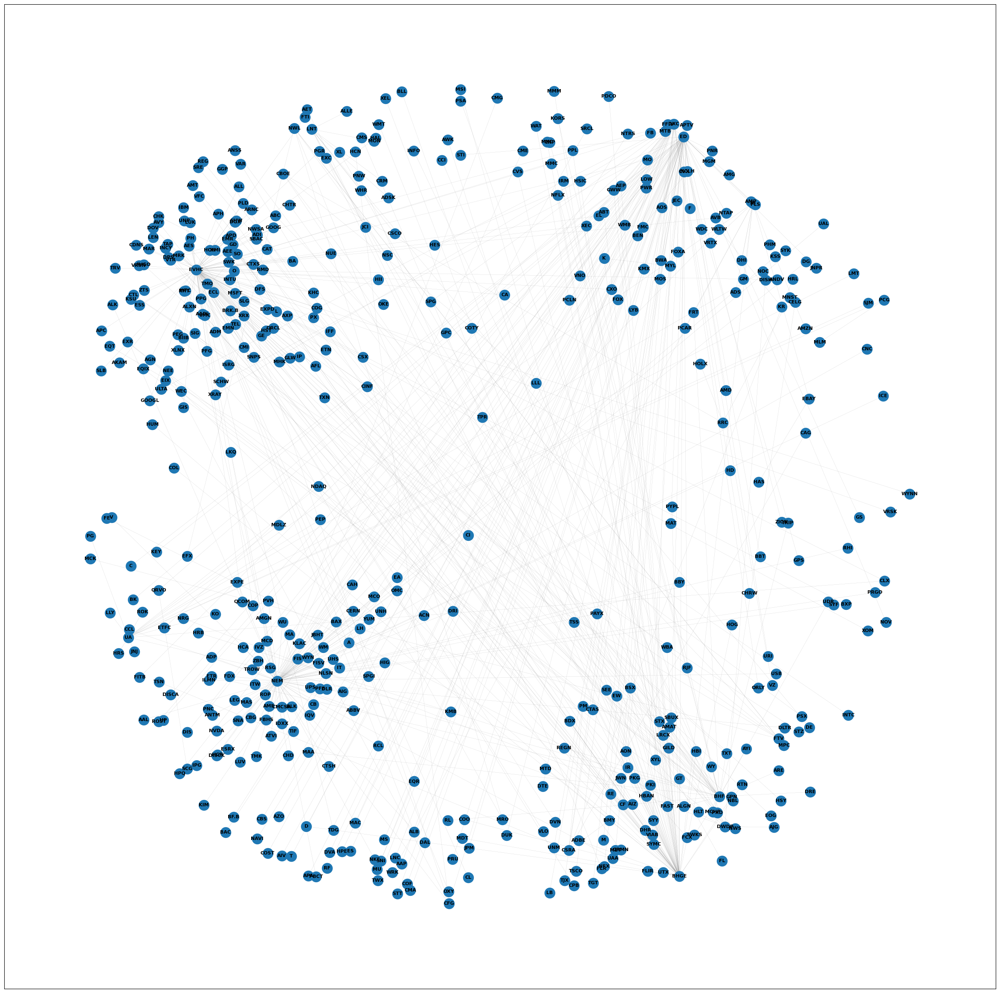

In [5]:
plt.figure(figsize=(30, 30))

pos = nx.spring_layout(mst_graph) 
nx.draw_networkx(mst_graph, pos, with_labels=True, font_size=8, font_color="black", font_weight="bold", edge_color="gray", width=0.1)
plt.show()

In [6]:
print(mst_graph.number_of_nodes())
print(mst_graph.number_of_edges())

505
504


In [7]:
print("Nodes:")
for node_id, attributes in mst_graph.nodes(data=True):
    print(f"Node {node_id}: {attributes}")

print("\nEdges:")
for edge in mst_graph.edges(data=True):
    print(f"Edge {edge[:2]}: {edge[2]}")

Nodes:
Node A: {'Name': 'Agilent Technologies', 'Sector': 'Health Care'}
Node AAL: {'Name': 'American Airlines Group', 'Sector': 'Industrials'}
Node AAP: {'Name': 'Advance Auto Parts', 'Sector': 'Consumer Discretionary'}
Node AAPL: {'Name': 'Apple', 'Sector': 'Information Technology'}
Node ABBV: {'Name': 'AbbVie', 'Sector': 'Health Care'}
Node ABC: {'Name': 'AmerisourceBergen', 'Sector': 'Health Care'}
Node ABT: {'Name': 'Abbott Laboratories', 'Sector': 'Health Care'}
Node ACN: {'Name': 'Accenture', 'Sector': 'Information Technology'}
Node ADBE: {'Name': 'Adobe', 'Sector': 'Information Technology'}
Node ADI: {'Name': 'Analog Devices', 'Sector': 'Information Technology'}
Node ADM: {'Name': 'ADM', 'Sector': 'Consumer Staples'}
Node ADP: {'Name': 'Automatic Data Processing', 'Sector': 'Information Technology'}
Node ADS: {}
Node ADSK: {'Name': 'Autodesk', 'Sector': 'Information Technology'}
Node AEE: {'Name': 'Ameren Corp', 'Sector': 'Utilities'}
Node AEP: {'Name': 'American Electric Power

In [8]:
# add threshold to the original graph
threshold = 0.5
threshold_graph = loaded_graph

remove_edges = [(u, v) for u, v, d in threshold_graph.edges(data=True) if d['weight']<threshold]
threshold_graph.remove_edges_from(remove_edges)

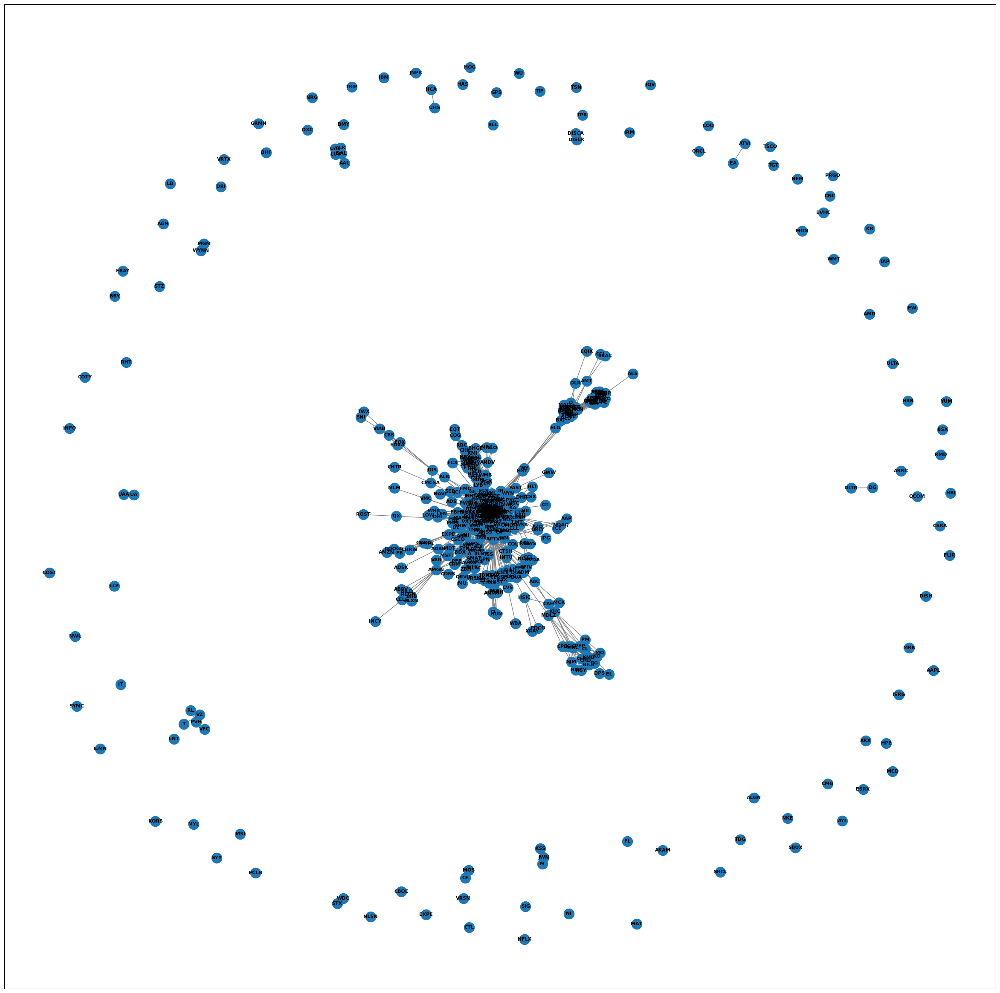

In [9]:
plt.figure(figsize=(30, 30))

pos = nx.spring_layout(threshold_graph) 
nx.draw_networkx(threshold_graph, pos, with_labels=True, font_size=8, font_color="black", font_weight="bold", edge_color="gray", width=1)
plt.show()

In [10]:
print(threshold_graph.number_of_nodes())
print(threshold_graph.number_of_edges())

505
4587


In [11]:
node_degrees = threshold_graph.degree()
connected_nodes = [node for node, degree in node_degrees if degree > 0]
print(len(connected_nodes))

415


In [12]:
nx.write_graphml(mst_graph, "pearson_correlation_mst_graph.graphml")
nx.write_graphml(threshold_graph, "pearson_correlation_threshold_graph.graphml")